In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8')
%config InlineBackend.figure_format = 'svg'

# Unsupervised Learning Final Project

This is the final project for the **Data Science in Python: Unsupervised Learning** course. This notebook is split into seven sections:
1. Data Prep & EDA
2. K-Means Clustering
3. PCA for Visualization
4. K-Means Clustering (Round 2)
5. PCA for Visualization (Round 2)
6. EDA on Clusters
7. Make Recommendations

## 0. Goal & Scope

**GOAL**: You are trying to better understand the company’s different segments of employees and how to increase employee retention within each segment.

**SCOPE**: Your task is to use a clustering technique to segment the employees, a dimensionality reduction technique to visualize the segments, and finally explore the clusters to make recommendations to increase retention.

## 1. Data Prep & EDA

### a. Data Prep: Check the data types

The data can be found in the `employee_data.csv` file.

In [2]:
from google.colab import files
uploaded_files = files.upload()

Saving employee_data.csv to employee_data.csv


In [3]:
# read in the employee data
employee = pd.read_csv('employee_data.csv')

In [ ]:
# note the number of rows and columns

In [4]:
employee

,EmployeeID,Age,Gender,DistanceFromHome,JobLevel,Department,MonthlyIncome,PerformanceRating,JobSatisfaction,Attrition
0,1001,41,Female,1,2,Sales,5993,3,4,Yes
1,1002,49,Male,8,2,Research & Development,5130,4,2,No
2,1004,37,Male,2,1,Research & Development,2090,3,3,Yes
3,1005,33,Female,3,1,Research & Development,2909,3,3,No
4,1007,27,Male,2,1,Research & Development,3468,3,2,No
...,...,...,...,...,...,...,...,...,...,...
1465,3061,36,Male,23,2,Research & Development,2571,3,4,No
1466,3062,39,Male,6,3,Research & Development,9991,3,1,No
1467,3064,27,Male,4,2,Research & Development,6142,4,2,No
1468,3065,49,Male,2,2,Sales,5390,3,2,No


In [5]:
# view the data types of all the columns
employee.dtypes

,0
EmployeeID,int64
Age,int64
Gender,object
DistanceFromHome,int64
JobLevel,int64
Department,object
MonthlyIncome,int64
PerformanceRating,int64
JobSatisfaction,int64
Attrition,object


In [6]:
employee.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   EmployeeID         1470 non-null   int64 
 1   Age                1470 non-null   int64 
 2   Gender             1470 non-null   object
 3   DistanceFromHome   1470 non-null   int64 
 4   JobLevel           1470 non-null   int64 
 5   Department         1470 non-null   object
 6   MonthlyIncome      1470 non-null   int64 
 7   PerformanceRating  1470 non-null   int64 
 8   JobSatisfaction    1470 non-null   int64 
 9   Attrition          1470 non-null   object
dtypes: int64(7), object(3)
memory usage: 115.0+ KB


In [7]:
# look at the numeric columns
employee.select_dtypes(include = 'number').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   EmployeeID         1470 non-null   int64
 1   Age                1470 non-null   int64
 2   DistanceFromHome   1470 non-null   int64
 3   JobLevel           1470 non-null   int64
 4   MonthlyIncome      1470 non-null   int64
 5   PerformanceRating  1470 non-null   int64
 6   JobSatisfaction    1470 non-null   int64
dtypes: int64(7)
memory usage: 80.5 KB


In [8]:
# look at the non-numeric columns
employee.select_dtypes(include = 'O').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Gender      1470 non-null   object
 1   Department  1470 non-null   object
 2   Attrition   1470 non-null   object
dtypes: object(3)
memory usage: 34.6+ KB


In [9]:
sns.pairplot(employee.drop(columns=["EmployeeID"]) ,
             corner = True,
             diag_kind='kde',
             hue = 'Attrition',
             palette= 'plasma')
sns.despine()

### b. Data Prep: Convert the data types

Use `np.where` and `pd.get_dummies` to create a DataFrame for modeling where all fields are numeric.

In [10]:
# create a copy of the dataframe
employee_df = employee.copy()

In [11]:
# look at the gender values
employee_df.Gender.value_counts()

,count
Gender,
Male,882
Female,588


In [12]:
# change gender into a numeric field using np.where
employee_df.Gender = np.where(employee_df.Gender == 'Male',1,0)
employee_df.Gender

,Gender
0,0
1,1
2,1
3,0
4,1
...,...
1465,1
1466,1
1467,1
1468,1


In [14]:
# look at the attrition values
employee_df.Attrition.value_counts()


,count
Attrition,
No,1233
Yes,237


In [15]:
# change attrition to a numeric field using np.where
employee_df.Attrition = np.where(employee_df.Attrition == "Yes", 1 ,0)
employee_df.Attrition

,Attrition
0,1
1,0
2,1
3,0
4,0
...,...
1465,0
1466,0
1467,0
1468,0


In [16]:
# look at the department values
employee_df.Department.value_counts()

,count
Department,
Research & Development,961
Sales,446
Human Resources,63


In [17]:
# change department to a numeric field via dummy variables
department_dummies = pd.get_dummies(employee_df.Department, dtype='int')
department_dummies

,Human Resources,Research & Development,Sales
0,0,0,1
1,0,1,0
2,0,1,0
3,0,1,0
4,0,1,0
...,...,...,...
1465,0,1,0
1466,0,1,0
1467,0,1,0
1468,0,0,1


In [18]:
# attach the columns back on to the dataframe
data = pd.concat([employee_df, department_dummies], axis = 1)
data.drop(columns = ["Department"], inplace = True)
data

,EmployeeID,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction,Attrition,Human Resources,Research & Development,Sales
0,1001,41,0,1,2,5993,3,4,1,0,0,1
1,1002,49,1,8,2,5130,4,2,0,0,1,0
2,1004,37,1,2,1,2090,3,3,1,0,1,0
3,1005,33,0,3,1,2909,3,3,0,0,1,0
4,1007,27,1,2,1,3468,3,2,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1465,3061,36,1,23,2,2571,3,4,0,0,1,0
1466,3062,39,1,6,3,9991,3,1,0,0,1,0
1467,3064,27,1,4,2,6142,4,2,0,0,1,0
1468,3065,49,1,2,2,5390,3,2,0,0,0,1


In [19]:
# view the cleaned dataframe
data.head()

,EmployeeID,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction,Attrition,Human Resources,Research & Development,Sales
0,1001,41,0,1,2,5993,3,4,1,0,0,1
1,1002,49,1,8,2,5130,4,2,0,0,1,0
2,1004,37,1,2,1,2090,3,3,1,0,1,0
3,1005,33,0,3,1,2909,3,3,0,0,1,0
4,1007,27,1,2,1,3468,3,2,0,0,1,0


In [20]:
# note the number of rows and columns
data.shape

(1470, 12)

### c. EDA

Our goal is to find the different types of employees at the company and take a look at their attrition (whether they end up leaving or not).

In [21]:
# what is the overall attrition for all employees in the data aka what percent of employees leave the company?
data.Attrition.mean()

np.float64(0.16122448979591836)

In [22]:
# create a summary table to show the mean of each column for employees who stay vs leave - what are your takeaways?
np.around(data.
          drop(columns =["EmployeeID"]).
          groupby("Attrition").mean(),
          2
          ).T

Attrition,0,1
Age,37.56,33.61
Gender,0.59,0.63
DistanceFromHome,8.92,10.63
JobLevel,2.15,1.64
MonthlyIncome,6832.74,4787.09
PerformanceRating,3.15,3.16
JobSatisfaction,2.78,2.47
Human Resources,0.04,0.05
Research & Development,0.67,0.56
Sales,0.29,0.39


### d. Data Prep: Remove the Attrition and ID Columns

Exclude the attrition column (to be overlayed onto our clusters later on) and the ID column.

In [23]:
# create a new dataframe without the attrition column and employee column for us to model on
df = data.drop(columns = ["EmployeeID", "Attrition"])

In [24]:
df.head()

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction,Human Resources,Research & Development,Sales
0,41,0,1,2,5993,3,4,0,0,1
1,49,1,8,2,5130,4,2,0,1,0
2,37,1,2,1,2090,3,3,0,1,0
3,33,0,3,1,2909,3,3,0,1,0
4,27,1,2,1,3468,3,2,0,1,0


In [25]:
# note the number of rows and columns in the dataframe
df.shape

(1470, 10)

In [26]:
# create a pair plot comparing all the columns of the dataframe - what observations do you notice?
sns.pairplot(df, corner= True, diag_kind='kde')
sns.despine()

## 2. K-Means Clustering

Let's segment the employees using K-Means clustering.

### a. Standardize the data

In [27]:
# scale the data using standardization
from sklearn.preprocessing import StandardScaler
std_scaler = StandardScaler()
standardized = std_scaler.fit_transform(df)
df_standardized = pd.DataFrame(standardized, columns = df.columns)
df_standardized.head()

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction,Human Resources,Research & Development,Sales
0,0.446350,-1.224745,-1.010909,-0.057788,-0.108350,-0.426230,1.153254,-0.211604,-1.374051,1.515244
1,1.322365,0.816497,-0.147150,-0.057788,-0.291719,2.346151,-0.660853,-0.211604,0.727775,-0.659960
2,0.008343,0.816497,-0.887515,-0.961486,-0.937654,-0.426230,0.246200,-0.211604,0.727775,-0.659960
3,-0.429664,-1.224745,-0.764121,-0.961486,-0.763634,-0.426230,0.246200,-0.211604,0.727775,-0.659960
4,-1.086676,0.816497,-0.887515,-0.961486,-0.644858,-0.426230,-0.660853,-0.211604,0.727775,-0.659960


In [28]:
# double check that all the column means are 0 and standard deviations are 1
df_standardized.agg(["mean", "std"]).T.round(2)

,mean,std
Age,-0.0,1.0
Gender,0.0,1.0
DistanceFromHome,0.0,1.0
JobLevel,-0.0,1.0
MonthlyIncome,-0.0,1.0
PerformanceRating,-0.0,1.0
JobSatisfaction,-0.0,1.0
Human Resources,0.0,1.0
Research & Development,0.0,1.0
Sales,0.0,1.0


### b. Write a loop to fit models with 2 to 15 clusters and record the inertia and silhouette scores

In [29]:
# import kmeans and write a loop to fit models with 2 to 15 clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
inertia_values = []
sil_scores = [] # list of all silhouette scores
for k in range(2 , 15+1):
  kmeans = KMeans(n_clusters=k , n_init= 10 , random_state=42)
  kmeans.fit(df_standardized)
  inertia_values.append(kmeans.inertia_)
  sil_score = silhouette_score(df_standardized , kmeans.labels_ , metric = 'euclidean', sample_size = None)
  sil_scores.append(sil_score)

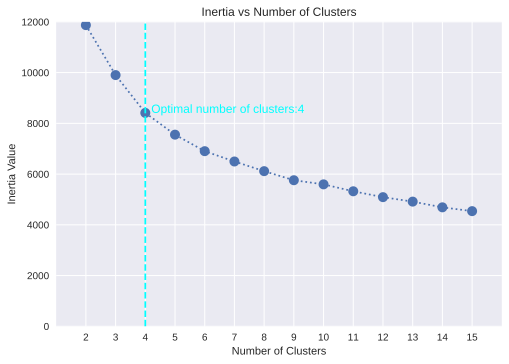

In [30]:
# plot the inertia values
plt.plot(range(2,15+1),
         inertia_values,
         marker = "o",
         markersize = 10,
         linestyle =":")
plt.plot([4,4],[0,12000], ls ="--", color = 'cyan')
plt.annotate("Optimal number of clusters:4", xy=(4+0.2,inertia_values[2]), color = 'cyan')
plt.title("Inertia vs Number of Clusters")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia Value")
plt.xticks(range(2,15+1,1))
plt.axis(xmin =1,xmax = 16,ymin = 0,ymax =12000)
plt.show()

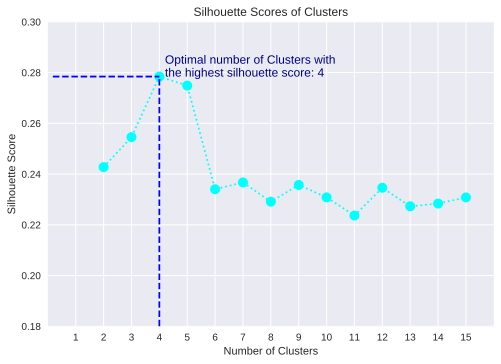

In [31]:
# plot the silhouette scores
plt.plot(range(2,15+1), sil_scores, marker ='o', ms =10 , ls =":", color = 'cyan')
plt.plot([4,4],[0.18,sil_scores[2]], ls ="--", color = 'blue')
plt.plot([0.18,4],[sil_scores[2],sil_scores[2]], ls ="--", color = 'blue')
#plt.plot([x1 ,x2] ,[y1,y2 ])
plt.annotate(f"Optimal number of Clusters with {'\n'}the highest silhouette score: 4",
             xy =(4+0.2, sil_scores[2]),
             color ='darkblue',
             )
plt.title("Silhouette Scores of Clusters")
plt.xlabel("Number of Clusters")
plt.xticks(range(1,15+1))
plt.ylabel("Silhouette Score")
plt.axis(xmin =0,xmax = 15+1,ymin = 0.18,ymax = 0.3)
plt.show()

### c. Identify a k value that looks like an elbow on the inertia plot and has a high silhouette score

In [32]:
# fit a kmeans model for the k value that you identified
kmeans4 = KMeans(n_clusters=4 ,n_init = 10 , random_state=42)
kmeans4.fit(df_standardized)

KMeans(n_clusters=4, n_init=10, random_state=42)

In [33]:
# find the number of employees in each cluster
pd.Series(kmeans4.labels_).value_counts()

,count
0,747
1,407
2,253
3,63


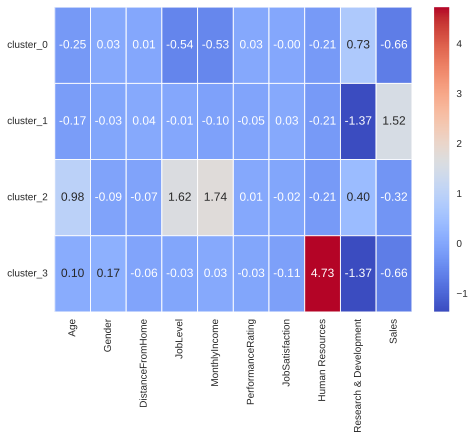

In [34]:
# create a heat map of the cluster centers
cluster_centers4 = pd.DataFrame(kmeans4.cluster_centers_,
                                columns = df_standardized.columns,
                                index= [f"cluster_{i}" for i in range(4)])
sns.heatmap(cluster_centers4 ,
            annot =True,
            cmap ='coolwarm',
            fmt ='2.2f',
            vmin = cluster_centers4.min().min(),
            vmax = cluster_centers4.max().max(),
            linecolor='white',
            linewidths=0.9)
plt.yticks(rotation = 0)
plt.show()

In [ ]:
# interpret the clusters


* cluster_0: Junior employee
* cluster_1: employees with high Sales score
* cluster_2: employees with high ages, high Job_level, and high Monthly income
* cluster_3: Human Resource Employees

## 3. PCA

Let's visualize the data using PCA.

### a. Fit a PCA Model with 2 components for visualization

In [35]:
# fit a PCA model with 2 components
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(df_standardized)

PCA(n_components=2)

In [36]:
# view the explained variance ratio
pca.explained_variance_ratio_ , pca.explained_variance_ratio_.sum()

(array([0.23793893, 0.18883434]), np.float64(0.4267732731018602))

In [37]:
# view the components
pca.components_

array([[ 0.43287352, -0.04877625, -0.00285089,  0.60509274,  0.59445012,
        -0.02556521, -0.00472736,  0.02964393, -0.21392918,  0.20833797],
       [ 0.21384802,  0.00840873, -0.01653328,  0.14533326,  0.17730123,
         0.04153184, -0.01140416, -0.11374447,  0.67887246, -0.65246219]])

In [38]:
# view the columns
df_standardized.columns

Index(['Age', 'Gender', 'DistanceFromHome', 'JobLevel', 'MonthlyIncome',
       'PerformanceRating', 'JobSatisfaction', 'Human Resources',
       'Research & Development', 'Sales'],
      dtype='object')

In [39]:
# interpret the components
df_pca = pd.DataFrame(pca.components_ ,
                      columns=df_standardized.columns ,
                      )
df_pca.round(4)

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction,Human Resources,Research & Development,Sales
0,0.4329,-0.0488,-0.0029,0.6051,0.5945,-0.0256,-0.0047,0.0296,-0.2139,0.2083
1,0.2138,0.0084,-0.0165,0.1453,0.1773,0.0415,-0.0114,-0.1137,0.6789,-0.6525


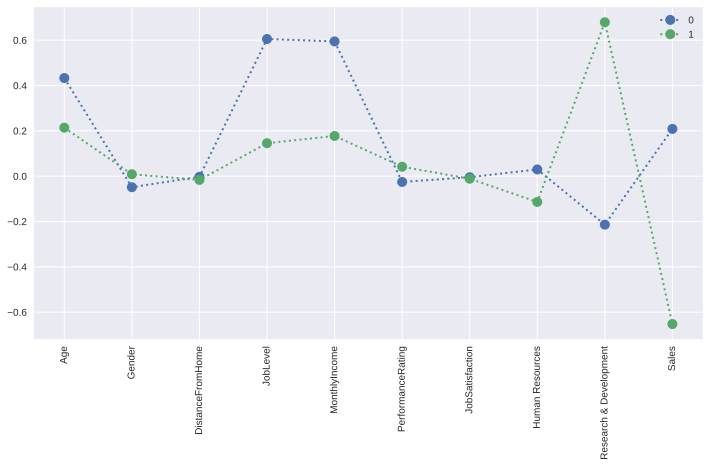

In [40]:
df_pca.T.plot(marker = 'o',
              figsize = (12,6),
              ms =10,
              ls =':',
              lw = 2)
plt.xticks(range(len(df_pca.columns)) , labels = df_pca.columns, rotation = 90)
plt.legend()
plt.show()

### b. Overlay the K-Means cluster colors

In [41]:
# transform the data
df_transformed = pd.DataFrame(pca.transform(df_standardized),
                              columns = ["pc1", "pc2"])
df_transformed.head()

,pc1,pc2
0,0.765263,-1.853973
1,-0.031684,1.285674
2,-1.462588,0.645564
3,-1.449531,0.563547
4,-1.758252,0.473654


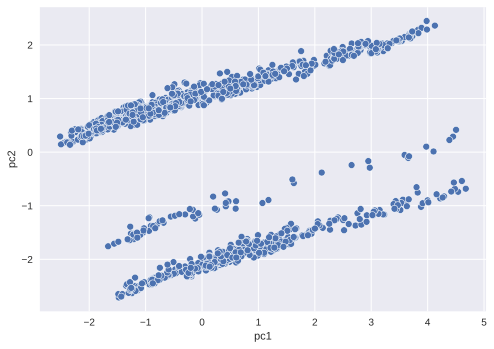

In [42]:
# plot the data
sns.scatterplot(x = "pc1", y = "pc2",data = df_transformed)
sns.despine()

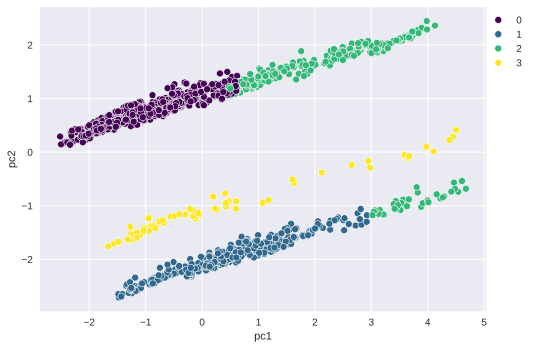

In [43]:
# overlay the kmeans clusters (hint: set the hue to be the cluster labels)
sns.scatterplot(x = "pc1", y = "pc2",data = df_transformed,
                hue = kmeans4.labels_,
                palette='viridis')
plt.legend(bbox_to_anchor = (1.1,1))
sns.despine()

In [44]:
employee_df.columns

Index(['EmployeeID', 'Age', 'Gender', 'DistanceFromHome', 'JobLevel',
       'Department', 'MonthlyIncome', 'PerformanceRating', 'JobSatisfaction',
       'Attrition'],
      dtype='object')

### c. Overlay the Department colors instead

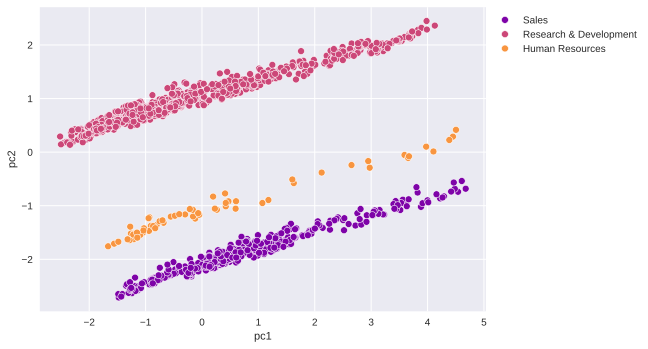

In [45]:
# overlay the department colors (hint: set the hue to be the department column)
sns.scatterplot(x = "pc1", y = "pc2",data = df_transformed,
                hue = employee_df["Department"],
                palette='plasma')
plt.legend(bbox_to_anchor = (1,1))
sns.despine()

## 4. K-Means Clustering: Round 2

Since the departments seemed to dominate the visualization, let's exclude them and try fitting more K-Means models.

In [46]:
df_standardized.columns

Index(['Age', 'Gender', 'DistanceFromHome', 'JobLevel', 'MonthlyIncome',
       'PerformanceRating', 'JobSatisfaction', 'Human Resources',
       'Research & Development', 'Sales'],
      dtype='object')

### a. Create a new dataframe without the Departments

In [47]:
# create a new dataframe that excludes the three department columns from the scaled dataframe
df_standardized_v2 = df_standardized.drop(columns=["Sales","Research & Development","Human Resources"])
df_standardized_v2.head(5)

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction
0,0.446350,-1.224745,-1.010909,-0.057788,-0.108350,-0.426230,1.153254
1,1.322365,0.816497,-0.147150,-0.057788,-0.291719,2.346151,-0.660853
2,0.008343,0.816497,-0.887515,-0.961486,-0.937654,-0.426230,0.246200
3,-0.429664,-1.224745,-0.764121,-0.961486,-0.763634,-0.426230,0.246200
4,-1.086676,0.816497,-0.887515,-0.961486,-0.644858,-0.426230,-0.660853


In [48]:
for k in range(2 , 15+1):
  kmeans = KMeans(n_clusters=k , n_init= 10 , random_state=42)
  kmeans.fit(df_standardized)
  inertia_values.append(kmeans.inertia_)
  sil_score = silhouette_score(df_standardized , kmeans.labels_ , metric = 'euclidean', sample_size = None)
  sil_scores.append(sil_score)

### b. Write a loop to fit models with 2 to 15 clusters and record the inertia and silhouette scores

In [49]:
# write a loop to fit models with 2 to 15 clusters
inertia_values2=[]
sil_scores2=[]

for k in range(2,15+1):
  kmeans_v2 = KMeans(n_clusters=k , n_init=10 , random_state=42)
  kmeans_v2.fit(df_standardized_v2)
  inertia_values2.append(kmeans_v2.inertia_)
  sil_score2 = silhouette_score(df_standardized_v2 , kmeans_v2.labels_ , metric = 'euclidean' , sample_size=None)
  sil_scores2.append(sil_score2)

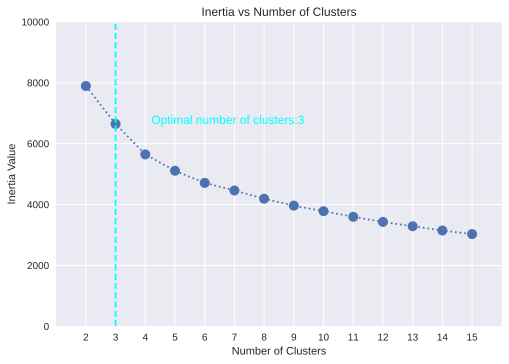

In [50]:
# plot the inertia values
plt.plot(range(2,15+1),
         inertia_values2,
         marker = "o",
         markersize = 10,
         linestyle =":")
plt.plot([3,3],[0,12000], ls ="--", color = 'cyan')
plt.annotate("Optimal number of clusters:3", xy=(4+0.2,inertia_values2[1]), color = 'cyan')
plt.title("Inertia vs Number of Clusters")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia Value")
plt.xticks(range(2,15+1,1))
plt.axis(xmin =1,xmax = 16,ymin = 0,ymax =10000)
plt.show()

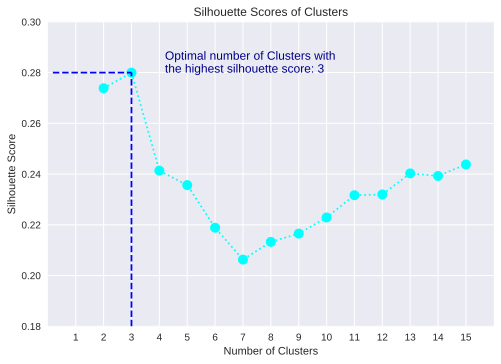

In [53]:
# plot the silhouette scores
plt.plot(range(2,15+1), sil_scores2, marker ='o', ms =10 , ls =":", color = 'cyan')
plt.plot([3,3],[0.18,sil_scores2[1]], ls ="--", color = 'blue')
plt.plot([0.18,3],[sil_scores2[1],sil_scores2[1]], ls ="--", color = 'blue')
#plt.plot([x1 ,x2] ,[y1,y2 ])
plt.annotate(f"Optimal number of Clusters with {'\n'}the highest silhouette score: 3",
             xy =(4+0.2, sil_scores2[1]),
             color ='darkblue',
             )
plt.title("Silhouette Scores of Clusters")
plt.xlabel("Number of Clusters")
plt.xticks(range(1,15+1))
plt.ylabel("Silhouette Score")
plt.axis(xmin =0,xmax = 15+1,ymin = 0.18,ymax = 0.3)
plt.show()

### c. Identify a few k values that looks like an elbow on the inertia plot and have a high silhouette score

#### i. k = [3]

In [54]:
# fit a kmeans model for the k value that you identified
kmeans3_v2 = KMeans(n_clusters=3 , n_init=10, random_state=42)
kmeans3_v2.fit(df_standardized_v2)

KMeans(n_clusters=3, n_init=10, random_state=42)

In [ ]:
# find the number of employees in each cluster
pd.Series(kmeans3_v2.labels_).value_counts()

,count
1,988
2,282
0,200


In [55]:
# create a heat map of the cluster centers
cluster_centers3_v2 = pd.DataFrame(kmeans3_v2.cluster_centers_ ,
                                   columns=df_standardized_v2.columns,
                                   index = [f"cluster_{i}" for i in range(3)]).round(3)
cluster_centers3_v2

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction
cluster_0,-0.167,-0.010,0.064,-0.311,-0.328,2.346,-0.017
cluster_1,-0.271,0.023,-0.011,-0.402,-0.423,-0.426,0.004
cluster_2,1.067,-0.074,-0.009,1.628,1.714,-0.171,-0.001


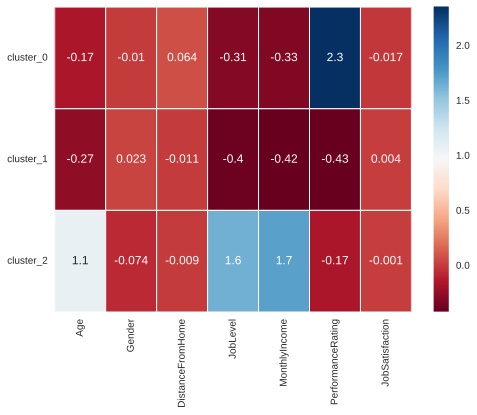

In [56]:
sns.heatmap(cluster_centers3_v2 ,
            vmin = cluster_centers3_v2.min().min(),
            vmax = cluster_centers3_v2.max().max(),
            annot = True,
            cmap = "RdBu",
            linecolor='white',
            linewidths=1
            )
plt.yticks(rotation =0)
sns.despine()

In [ ]:
# interpret the clusters

* Cluster 0: high performing employees
* Cluster 1: junior, low performing employees
* Cluster 2: senior employees

#### ii. k = [4]

In [57]:
# fit a kmeans model for the k value that you identified
kmeans4_v2 = KMeans(n_clusters=4 , n_init=10, random_state=42)
kmeans4_v2.fit(df_standardized_v2)

KMeans(n_clusters=4, n_init=10, random_state=42)

In [58]:
# find the number of employees in each cluster
pd.Series(kmeans4_v2.labels_).value_counts()

,count
2,616
0,405
1,249
3,200


In [59]:
# create a heat map of the cluster centers
cluster_centers4_v2 = pd.DataFrame(kmeans4_v2.cluster_centers_ ,
                                   columns=df_standardized_v2.columns,
                                   index = [f"Cluster_{i}" for i in range(4)]).round(3)
cluster_centers4_v2

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction
Cluster_0,-0.217,-1.225,-0.037,-0.319,-0.355,-0.426,-0.016
Cluster_1,1.179,-0.020,-0.005,1.731,1.839,-0.137,-0.009
Cluster_2,-0.280,0.816,0.006,-0.389,-0.403,-0.426,0.019
Cluster_3,-0.167,-0.010,0.064,-0.311,-0.328,2.346,-0.017


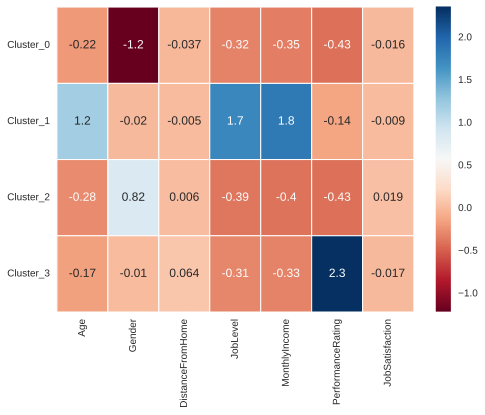

In [60]:
# interpret the clusters
sns.heatmap(cluster_centers4_v2 ,
            vmin = cluster_centers4_v2.min().min(),
            vmax = cluster_centers4_v2.max().max(),
            annot = True,
            cmap = "RdBu",
            linecolor='white',
            linewidths=1
            )
plt.yticks(rotation =0)
sns.despine()

Interpret the clusters:
* Cluster 0: female employees
* Cluster 1: senior employees
* Cluster 2: male employees
* Cluster 3: high performing employees

#### iii. k = [6]

In [61]:
# fit a kmeans model for the k value that you identified
kmeans6_v2 = KMeans(n_clusters=6 , n_init=10, random_state=42)
kmeans6_v2.fit(df_standardized_v2)

KMeans(n_clusters=6, n_init=10, random_state=42)

In [62]:
# find the number of employees in each cluster
pd.Series(kmeans6_v2.labels_).value_counts()

,count
3,349
0,304
4,219
5,201
1,200
2,197


In [63]:
# create a heat map of the cluster centers
cluster_centers6_v2 = pd.DataFrame(kmeans6_v2.cluster_centers_ ,
                                   columns=df_standardized_v2.columns,
                                   index = [f"Cluster_{i}" for i in range(6)]).round(3)
cluster_centers6_v2

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction
Cluster_0,-0.254,0.816,-0.461,-0.373,-0.359,-0.426,0.727
Cluster_1,-0.167,-0.010,0.064,-0.311,-0.328,2.346,-0.017
Cluster_2,-0.101,0.174,1.705,-0.223,-0.284,-0.426,0.062
Cluster_3,-0.219,-1.225,-0.347,-0.327,-0.362,-0.426,0.004
Cluster_4,1.215,-0.078,-0.089,1.853,1.980,-0.097,0.010
Cluster_5,-0.295,0.816,-0.339,-0.359,-0.381,-0.426,-1.162


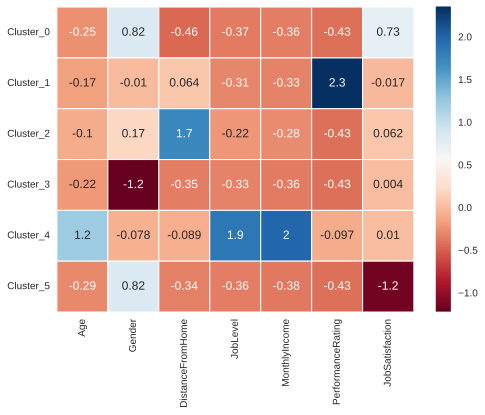

In [64]:
# interpret the clusters
sns.heatmap(cluster_centers6_v2 ,
            vmin = cluster_centers6_v2.min().min(),
            vmax = cluster_centers6_v2.max().max(),
            annot = True,
            cmap = "RdBu",
            linecolor='white',
            linewidths=1
            )
plt.yticks(rotation =0)
sns.despine()

* Cluster 0: men who like their jobs
* Cluster 1: high performers
* Cluster 2: long commuters
* Cluster 3: women
* Cluster 4: senior employee
* Cluster 5: men who dislike their jobs

## 5. PCA: Round 2

Let's visualize the data (without Departments) using PCA.

### a. Fit a PCA Model with 2 components for visualization

In [68]:
# fit a PCA model with 2 components
pca_v2 = PCA(n_components=2)

In [69]:
pca_v2.fit(df_standardized_v2)

PCA(n_components=2)

In [71]:
# view the explained variance ratio
pca_v2.explained_variance_ratio_ , np.sum(pca_v2.explained_variance_ratio_)

(array([0.33354222, 0.14850324]), np.float64(0.48204546371348667))

In [72]:
# view the components
pca_v2.components_

array([[ 0.47124275, -0.0460627 , -0.00629691,  0.62393147,  0.62140377,
        -0.01687984, -0.00712661],
       [-0.01896906,  0.58615904, -0.41405416,  0.01838822,  0.02778096,
        -0.4833175 ,  0.49991119]])

In [73]:
# view the columns
df_standardized_v2.columns

Index(['Age', 'Gender', 'DistanceFromHome', 'JobLevel', 'MonthlyIncome',
       'PerformanceRating', 'JobSatisfaction'],
      dtype='object')

In [86]:
# interpret the components
df_pca_v2 = pd.DataFrame(pca_v2.components_ ,
                         columns = df_standardized_v2.columns,
                         index = ["pc1","pc2"])
df_pca_v2

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction
pc1,0.471243,-0.046063,-0.006297,0.623931,0.621404,-0.016880,-0.007127
pc2,-0.018969,0.586159,-0.414054,0.018388,0.027781,-0.483317,0.499911


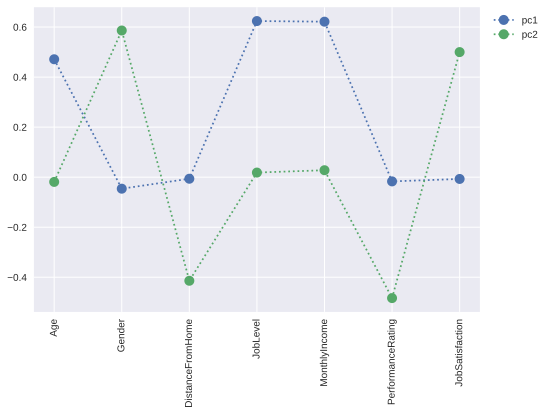

In [85]:
df_pca_v2.T.plot(marker = 'o', ms = 10 , ls = ":")
plt.xticks(range(len(df_standardized_v2.columns)),
           labels = df_standardized_v2.columns.to_list(),
           rotation = 90)
plt.legend(bbox_to_anchor = (1.15,1))
plt.show()

### b. Overlay the K-Means cluster colors

In [88]:
# transform the data
df_transformed2_v2 = pd.DataFrame(pca_v2.transform(df_standardized_v2), columns = ["pc1", "pc2"])
df_transformed2_v2

,pc1,pc2
0,0.168712,0.470665
1,0.334248,-0.959030
2,-1.205213,1.131272
3,-1.210236,-0.103169
4,-1.532824,0.706731
...,...,...
1465,-0.652241,0.533322
1466,1.078713,0.095731
1467,-0.664267,-0.702991
1468,0.420037,0.688997


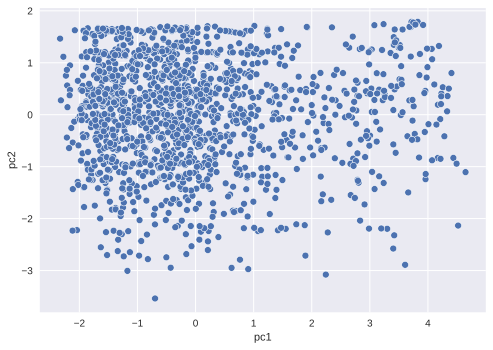

In [89]:
# plot the data
sns.scatterplot(df_transformed_v2 , x = "pc1", y = "pc2")
plt.show()

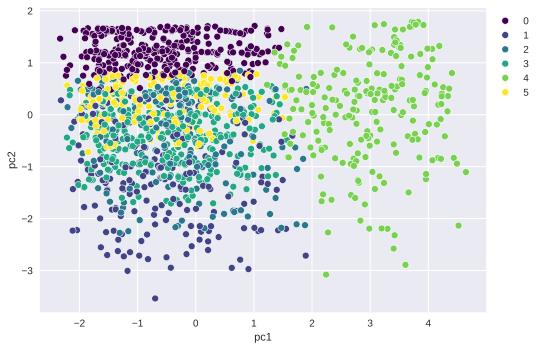

In [101]:
# overlay the kmeans clusters (choose your favorite k-means model from the previous section)
sns.scatterplot(df_transformed_v2, x = "pc1", y = "pc2", hue = kmeans6_v2.labels_, palette='viridis')
plt.legend(bbox_to_anchor = (1,1))
plt.show()

### c. OPTIONAL: Create a 3D plot

In [102]:
# fit a PCA model with 3 components
pca3_v2 = PCA(n_components=3)
pca3_v2.fit(df_standardized_v2)

PCA(n_components=3)

In [103]:
# view the explained variance ratio
pca3_v2.explained_variance_ratio_ , np.sum(pca3_v2.explained_variance_ratio_)

(array([0.33354222, 0.14850324, 0.14578114]), np.float64(0.6278266007097651))

In [104]:
# view the components
pca3_v2.components_

array([[ 0.47124275, -0.0460627 , -0.00629691,  0.62393147,  0.62140377,
        -0.01687984, -0.00712661],
       [-0.01896906,  0.58615904, -0.41405416,  0.01838822,  0.02778096,
        -0.4833175 ,  0.49991119],
       [ 0.02702996,  0.36313603,  0.55488385,  0.02159616,  0.01065236,
         0.52050007,  0.53666127]])

In [105]:
# view the columns
df_standardized_v2.columns

Index(['Age', 'Gender', 'DistanceFromHome', 'JobLevel', 'MonthlyIncome',
       'PerformanceRating', 'JobSatisfaction'],
      dtype='object')

In [107]:
# interpret the components
df_pca3_v2 = pd.DataFrame(pca3_v2.components_ , columns =df_standardized_v2.columns ,
                          index = ["pc1", "pc2","pc3"])
df_pca3_v2

,Age,Gender,DistanceFromHome,JobLevel,MonthlyIncome,PerformanceRating,JobSatisfaction
pc1,0.471243,-0.046063,-0.006297,0.623931,0.621404,-0.016880,-0.007127
pc2,-0.018969,0.586159,-0.414054,0.018388,0.027781,-0.483317,0.499911
pc3,0.027030,0.363136,0.554884,0.021596,0.010652,0.520500,0.536661


In [108]:
# transform the data
df_transformed3_v2 = pd.DataFrame(pca3_v2.transform(df_standardized_v2),
                                  columns = ["pc1", "pc2","pc3"])

df_transformed3_v2

,pc1,pc2,pc3
0,0.168712,0.470665,-0.598970
1,0.334248,-0.959030,1.112754
2,-1.205213,1.131272,-0.316222
3,-1.210236,-0.103169,-0.998987
4,-1.532824,0.706731,-0.829482
...,...,...,...
1465,-0.652241,0.533322,1.626062
1466,1.078713,0.095731,-0.953070
1467,-0.664267,-0.702991,0.776050
1468,0.420037,0.688997,-0.740499


In [111]:
# create a 3d scatter plot

In [112]:
cluster_labels = pd.Series(kmeans6_v2.labels_, name='cluster') # combine the data and cluster labels
df_clean = pd.concat([df_transformed3_v2, cluster_labels], axis=1) # create a clean dataframe
df_clean

,pc1,pc2,pc3,cluster
0,0.168712,0.470665,-0.598970,3
1,0.334248,-0.959030,1.112754,1
2,-1.205213,1.131272,-0.316222,0
3,-1.210236,-0.103169,-0.998987,3
4,-1.532824,0.706731,-0.829482,5
...,...,...,...,...
1465,-0.652241,0.533322,1.626062,2
1466,1.078713,0.095731,-0.953070,5
1467,-0.664267,-0.702991,0.776050,1
1468,0.420037,0.688997,-0.740499,5


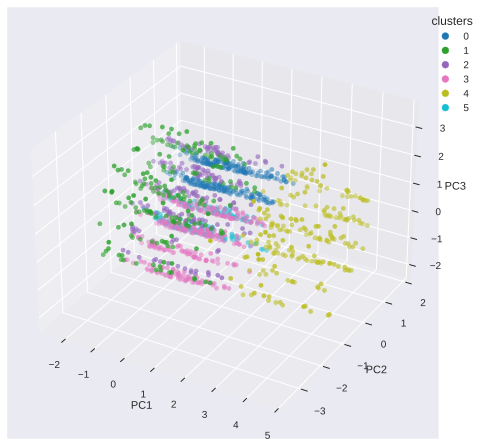

In [115]:
from mpl_toolkits.mplot3d import Axes3D

# create a 3d scatter plot
fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig)
fig.add_axes(ax)

# specify the data and labels
sc = ax.scatter(df_clean['pc1'], df_clean['pc2'], df_clean['pc3'],
                c=df_clean['cluster'], cmap='tab10')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# add a legend
plt.legend(*sc.legend_elements(), title='clusters',
           bbox_to_anchor=(1.1, 1));

## 6. EDA on Clusters

Let's decide to go with the 6 clusters without department data.

### a. Confirm the 6 clusters

In [116]:
# fit a kmeans model with 6 clusters
kmeans6_v2

KMeans(n_clusters=6, n_init=10, random_state=42)

In [117]:
# view the cluster labels
kmeans6_v2.labels_

array([3, 1, 0, ..., 1, 5, 0], dtype=int32)

### b. Create a dataframe with the cluster labels and names

In [128]:
# create a dataframe with two columns - one of the label and another of the cluster name
clusters = pd.DataFrame(kmeans6_v2.labels_ , columns = ["Cluster"] )
clusters

,Cluster
0,3
1,1
2,0
3,3
4,5
...,...
1465,2
1466,5
1467,1
1468,5


In [129]:
# create a mapping for the cluster names
clusters_mapping = {0: 'Men who like their jobs',
                   1: 'High performers',
                   2: 'Long commuters',
                   3: 'Female employees',
                   4: 'Senior employees',
                   5: 'Men who dislike their jobs'}

In [130]:
# combine the labels and names into a single dataframe
clusters["cluster_name"] = clusters.Cluster.map(clusters_mapping)

In [131]:
clusters

,Cluster,cluster_name
0,3,Female employees
1,1,High performers
2,0,Men who like their jobs
3,3,Female employees
4,5,Men who dislike their jobs
...,...,...
1465,2,Long commuters
1466,5,Men who dislike their jobs
1467,1,High performers
1468,5,Men who dislike their jobs


### c. View the attrition rates for each cluster

In [133]:
employee_df

,EmployeeID,Age,Gender,DistanceFromHome,JobLevel,Department,MonthlyIncome,PerformanceRating,JobSatisfaction,Attrition
0,1001,41,0,1,2,Sales,5993,3,4,1
1,1002,49,1,8,2,Research & Development,5130,4,2,0
2,1004,37,1,2,1,Research & Development,2090,3,3,1
3,1005,33,0,3,1,Research & Development,2909,3,3,0
4,1007,27,1,2,1,Research & Development,3468,3,2,0
...,...,...,...,...,...,...,...,...,...,...
1465,3061,36,1,23,2,Research & Development,2571,3,4,0
1466,3062,39,1,6,3,Research & Development,9991,3,1,0
1467,3064,27,1,4,2,Research & Development,6142,4,2,0
1468,3065,49,1,2,2,Sales,5390,3,2,0


In [134]:
# combine the clusters and attrition data
clusters = pd.concat([clusters , employee_df["Attrition"]], axis = 1)
clusters

,Cluster,cluster_name,Attrition
0,3,Female employees,1
1,1,High performers,0
2,0,Men who like their jobs,1
3,3,Female employees,0
4,5,Men who dislike their jobs,0
...,...,...,...
1465,2,Long commuters,0
1466,5,Men who dislike their jobs,0
1467,1,High performers,0
1468,5,Men who dislike their jobs,0


In [135]:
# what is the attrition rate for each cluster?
clusters.groupby(["cluster_name"])["Attrition"].mean()

,Attrition
cluster_name,
Female employees,0.154728
High performers,0.185000
Long commuters,0.218274
Men who dislike their jobs,0.189055
Men who like their jobs,0.161184
Senior employees,0.073059


In [136]:
# sort the values
clusters.groupby(["cluster_name"])["Attrition"].mean().sort_values(ascending=False)

,Attrition
cluster_name,
Long commuters,0.218274
Men who dislike their jobs,0.189055
High performers,0.185000
Men who like their jobs,0.161184
Female employees,0.154728
Senior employees,0.073059


In [ ]:
# interpret the findings


* Long commuters are most likely to leave
* Senior employees are most likely to stay

In [137]:
# find the number of employees in each cluster
clusters["cluster_name"].value_counts()

,count
cluster_name,
Female employees,349
Men who like their jobs,304
Senior employees,219
Men who dislike their jobs,201
High performers,200
Long commuters,197


### d. View the department breakdown for each cluster

In [138]:
# combine the clusters and department data
clusters = pd.concat([clusters, employee_df["Department"]],axis = 1)
clusters

,Cluster,cluster_name,Attrition,Department
0,3,Female employees,1,Sales
1,1,High performers,0,Research & Development
2,0,Men who like their jobs,1,Research & Development
3,3,Female employees,0,Research & Development
4,5,Men who dislike their jobs,0,Research & Development
...,...,...,...,...
1465,2,Long commuters,0,Research & Development
1466,5,Men who dislike their jobs,0,Research & Development
1467,1,High performers,0,Research & Development
1468,5,Men who dislike their jobs,0,Sales


In [139]:
# what is the attrition rate for each cluster + department combination?
clusters.groupby(["cluster_name", "Department"])["Attrition"].mean()

cluster_name                Department            
Female employees            Human Resources           0.300000
                            Research & Development    0.121076
                            Sales                     0.206897
High performers             Human Resources           0.142857
                            Research & Development    0.188406
                            Sales                     0.181818
Long commuters              Human Resources           0.666667
                            Research & Development    0.153846
                            Sales                     0.311475
Men who dislike their jobs  Human Resources           0.214286
                            Research & Development    0.172131
                            Sales                     0.215385
Men who like their jobs     Human Resources           0.071429
                            Research & Development    0.152284
                            Sales                     0.193548
Senior employees            Human Resources           0.000000
                            Research & Development    0.059603
                            Sales                     0.125000
Name: Attrition, dtype: float64

In [140]:
# sort the values
clusters.groupby(["cluster_name", "Department"])["Attrition"].mean().sort_values(ascending=False)

cluster_name                Department            
Long commuters              Human Resources           0.666667
                            Sales                     0.311475
Female employees            Human Resources           0.300000
Men who dislike their jobs  Sales                     0.215385
                            Human Resources           0.214286
Female employees            Sales                     0.206897
Men who like their jobs     Sales                     0.193548
High performers             Research & Development    0.188406
                            Sales                     0.181818
Men who dislike their jobs  Research & Development    0.172131
Long commuters              Research & Development    0.153846
Men who like their jobs     Research & Development    0.152284
High performers             Human Resources           0.142857
Senior employees            Sales                     0.125000
Female employees            Research & Development    0.121076
Men who like their jobs     Human Resources           0.071429
Senior employees            Research & Development    0.059603
                            Human Resources           0.000000
Name: Attrition, dtype: float64

Interpret the findings:
* The groups most likely to leave are people with long commutes, women in HR and those in HR and sales
* The groups most likely NOT to leave are senior employees, men who like their jobs and those in research and development

In [143]:
clusters.columns

Index(['Cluster', 'cluster_name', 'Attrition', 'Department'], dtype='object')

In [144]:
# find the number of employees in each cluster + department combo
clusters.groupby(["cluster_name", "Department"])["Cluster"].count()

cluster_name                Department            
Female employees            Human Resources            10
                            Research & Development    223
                            Sales                     116
High performers             Human Resources             7
                            Research & Development    138
                            Sales                      55
Long commuters              Human Resources             6
                            Research & Development    130
                            Sales                      61
Men who dislike their jobs  Human Resources            14
                            Research & Development    122
                            Sales                      65
Men who like their jobs     Human Resources            14
                            Research & Development    197
                            Sales                      93
Senior employees            Human Resources            12
                            Research & Development    151
                            Sales                      56
Name: Cluster, dtype: int64

## 7. Make Recommendations

In [150]:
# looking at the clusters, what segment info would you share with the team?
clusters.groupby(["cluster_name"]).agg({"Attrition":"mean"}).sort_values("Attrition", ascending = False)

,Attrition
cluster_name,
Long commuters,0.218274
Men who dislike their jobs,0.189055
High performers,0.185000
Men who like their jobs,0.161184
Female employees,0.154728
Senior employees,0.073059


# what recommendations would you suggest to retain employees in each cluster?
# **Higher Attrition**
* Long commuters: find remote options,create a more inclusive remote culture
* Men who dislike their job: have their managers have conversations with them.
* High performance: find opportunities for more senior positions

# **Lower Attrition**
* Senior employee: this makes sense that they have less attrition since they've been around a long time
* Female employee: this is an interesting finding, dig more into why this is the case.
* Men who like their jobs: this makes sense that people who like their job will stay.